## Topic 1: Scaled Dot-Product Attention – Why We Scale

---

### 1. Introduction

**What it is:**  
In the Transformer model, self-attention is the core mechanism that allows each word to look at every other word in a sentence to build a rich, context-aware representation. The original paper *"Attention Is All You Need"* introduces a modified version called **Scaled Dot-Product Attention**. The only difference from basic self-attention is the addition of a scaling factor: **dividing by √dₖ** (the square root of the key vector dimension).

**Why it’s important:**  
Without scaling, when the vectors have high dimensions, the dot products become very large, causing extreme softmax probabilities. This leads to **vanishing gradients** and unstable training. Scaling keeps the variance constant, ensuring stable and efficient learning.

**Real-life use:**  
Every modern large language model (like GPT, BERT, LLaMA) uses scaled dot-product attention in every Transformer block. Understanding this scaling is essential for grasping why Transformers train so well.

---

### 2. Detailed Explanation

#### Step 1: Quick Recap of Self-Attention (from previous video)
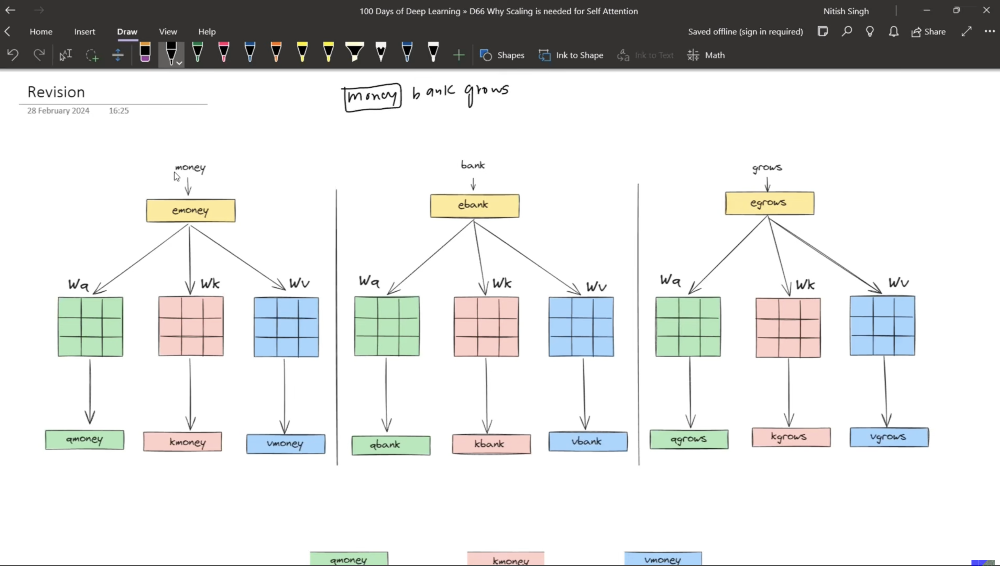
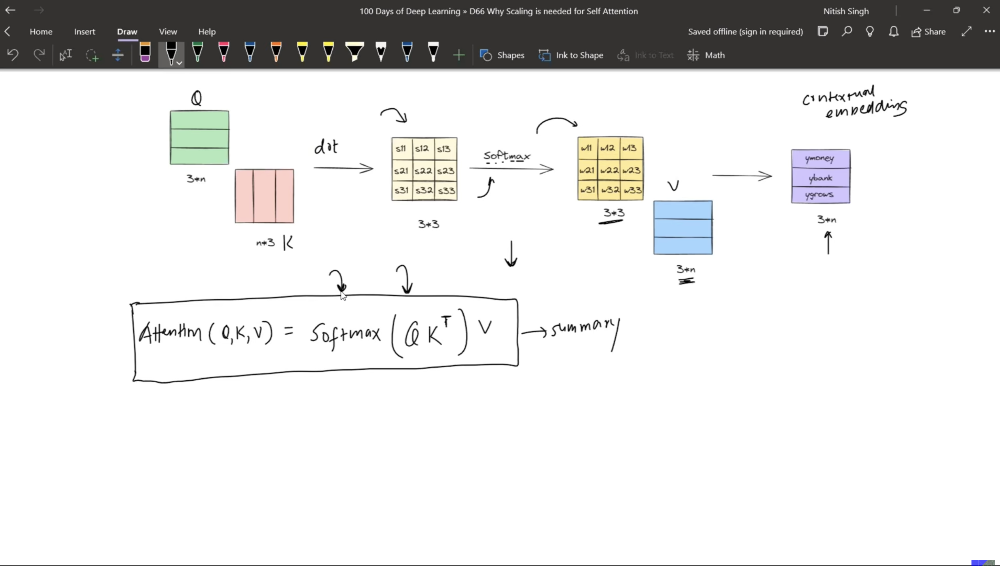
Imagine the sentence: **"money bank grow"**

1. Each word has an **embedding** (a vector of numbers, e.g., 3-dimensional).
2. For each word, we multiply its embedding by three trainable weight matrices:
   - **Wᵠ** → produces the **Query (Q)** vector
   - **Wᴷ** → produces the **Key (K)** vector
   - **Wⱽ** → produces the **Value (V)** vector
3. We stack all query vectors into a **Q matrix**, all keys into a **K matrix**, and all values into a **V matrix**.
4. The self-attention formula (without scaling) is:

   **Attention(Q, K, V) = softmax(Q · Kᵀ) · V**

   - **Q · Kᵀ** gives a matrix of similarity scores (how much each word attends to each other word).
   - **softmax** turns those scores into probabilities (sum = 1).
   - Multiplying by **V** produces the final context-aware embeddings.

#### Step 2: What is dₖ?

- **dₖ** = **dimension of the Key (and Query) vectors**.
- If each word’s key vector is 3-dimensional, then dₖ = 3.  
  If it’s 512-dimensional (common in practice), then dₖ = 512.

In the diagram, the scaling factor appears as:  
**√dₖ** (square root of dₖ).

So the **scaled** version becomes:

**Scaled Attention(Q, K, V) = softmax( (Q · Kᵀ) / √dₖ ) · V**

This means: take every number in the Q·Kᵀ matrix and divide it by √dₖ *before* applying softmax.

#### Step 3: The Core Problem – Why Do We Need Scaling?

The problem lies in the **nature of the dot product**.

- When you take the dot product of two **low-dimensional** vectors, the resulting values have **low variance**.
- When you take the dot product of two **high-dimensional** vectors, the resulting values have **high variance**.

**Why does that happen?**  
Think of each dimension as contributing a random number. The dot product sums over all dimensions. As you add more dimensions, the sum grows, so the spread (variance) of possible dot-product values increases.

**Let’s illustrate with an experiment** (from the transcript):
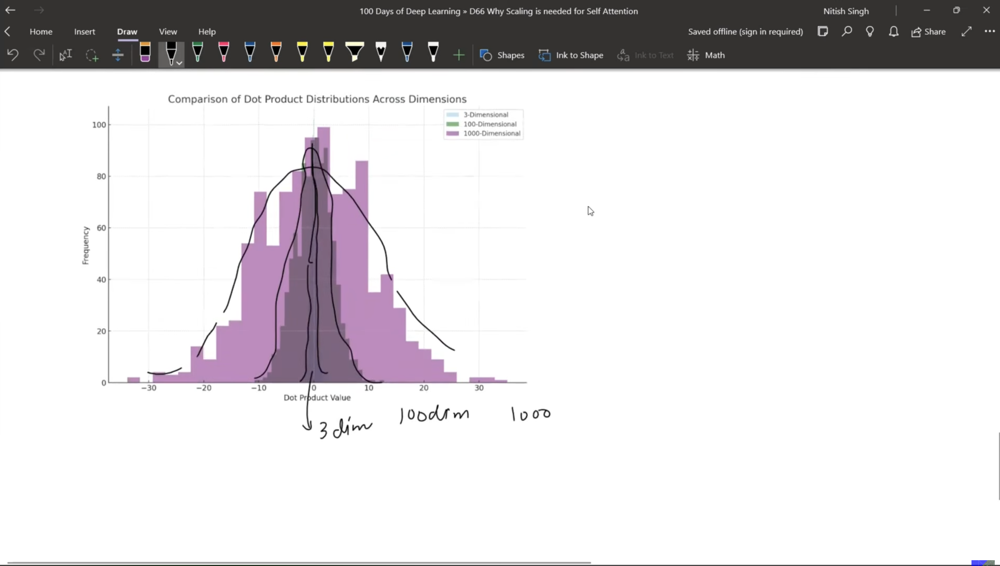

| Vector Dimension | Spread (range) of dot-product values | Variance |
|------------------|---------------------------------------|----------|
| 3                | narrow (e.g., -3 to +3)               | Low      |
| 100              | wider (e.g., -10 to +10)              | Medium   |
| 1000             | very wide (e.g., -30 to +30)          | High     |

So as dₖ grows, the numbers in Q·Kᵀ become **very large** and **very spread out**.

#### Step 4: Why High Variance is a Problem for Softmax

Softmax takes a set of numbers and converts them into probabilities. Its behaviour:

- If the numbers are **small and close together**, softmax gives **balanced probabilities** (e.g., 0.3, 0.35, 0.35).
- If the numbers are **large and far apart**, softmax gives **extreme probabilities** – one value close to 1, others close to 0.

Example from the transcript:

- Input: `[1, 2, 3]` → softmax → `[0.09, 0.24, 0.67]` (balanced)
- Input: `[1, 10, 100]` → softmax → `[~0, ~0, ~1]` (extreme)

**The danger:**  
When softmax outputs extreme probabilities, the gradients during backpropagation become very small for the low-probability items (vanishing gradients). The training focuses only on the large values, ignoring the small ones. This makes learning unstable and ineffective.

**Analogy from the transcript:**  
Imagine a classroom where some children are very tall and some very short. When the teacher asks for questions by show of hands, only the tall children are visible. The short children’s doubts are ignored. Over time, the class learns only from the tall children’s questions. That’s like training only on large numbers.  
If all children are of similar height (low variance), the teacher sees everyone and addresses all doubts equally – that’s stable training.

#### Step 5: The Solution – Reduce Variance by Scaling

We have a matrix of numbers (Q·Kᵀ) with high variance. We need to **reduce the variance** to keep softmax balanced.

**How to reduce variance of a set of numbers?**  
Divide all numbers by a constant.  
Example: `[10, 20, 30, 40, 50, 60, 70]` has variance 400.  
Divide by 10 → `[1, 2, 3, 4, 5, 6, 7]` → variance becomes 4.  
So scaling reduces variance.

**The big question:** What constant should we divide by, so that variance stays constant regardless of dₖ?

#### Step 6: Mathematical Derivation of √dₖ

Let’s focus on just one row of the Q·Kᵀ matrix (the rest behave the same way).  
This row contains dot products of one query vector with all key vectors.

Suppose vectors are **1-dimensional**:
- Dot product = product of two single numbers.  
- Let the variance of this dot product be **Var(X)**.

Now suppose vectors are **d-dimensional**:
- Each dot product is the sum of d individual products.  
- If each dimension contributes independently, the variance of the sum becomes **d × Var(X)**.

So **variance grows linearly with dimension dₖ**.

We want the variance to stay at Var(X) regardless of dₖ.  
We can use the rule:  
If you have a random variable Y with variance σ², and you create Z = Y / c, then  
**Var(Z) = σ² / c²**.

We have variance = dₖ × Var(X).  
We want the new variance = Var(X).  
So we need:  
dₖ × Var(X) / c² = Var(X)  
→ c² = dₖ  
→ **c = √dₖ**

Therefore, we divide every element in Q·Kᵀ by **√dₖ**. That keeps the variance fixed at Var(X), no matter how large dₖ becomes.

**Final scaled formula:**  
**Attention(Q, K, V) = softmax( Q·Kᵀ / √dₖ ) · V**

---

### 3. Key Points

- **Scaling is not optional** – it’s essential for stable training in Transformers.
- Without scaling, high-dimensional dot products produce **high variance**.
- High variance → extreme softmax probabilities → **vanishing gradients** → poor learning.
- Scaling by **√dₖ** keeps the variance constant, so softmax probabilities remain balanced.
- dₖ = dimension of the key (and query) vectors.
- The scaling factor comes from the mathematical property that variance of a sum of d independent terms grows linearly with d.

---

### 4. Syntax / Structure (from transcript)

The mathematical notation for scaled dot-product attention:

```
Attention(Q, K, V) = softmax( (Q · Kᵀ) / √dₖ ) · V
```

**Line-by-line meaning:**

| Part | Meaning |
|------|---------|
| **Q** | Query matrix – stacked query vectors for all words |
| **K** | Key matrix – stacked key vectors for all words |
| **V** | Value matrix – stacked value vectors for all words |
| **Q · Kᵀ** | Matrix multiplication – computes dot product of every query with every key (similarity scores) |
| **/ √dₖ** | Divide every element of that matrix by the square root of the key dimension (scaling) |
| **softmax( ... )** | Converts each row into probabilities (attention weights) |
| **· V** | Multiply the attention weights by the value matrix to get the final context-aware embeddings |

---

### 5. Code Example

The transcript includes a conceptual code demonstration (histogram generation) – here’s a simplified version in Python to show the effect:

```python
import numpy as np
import matplotlib.pyplot as plt

# Function to simulate dot products for different dimensions
def plot_dot_product_distribution(dim, num_pairs=1000):
    # Generate num_pairs pairs of random vectors of given dimension
    # Each vector has mean 0, variance 1
    v1 = np.random.randn(num_pairs, dim)  # shape: (1000, dim)
    v2 = np.random.randn(num_pairs, dim)
    dot_products = np.sum(v1 * v2, axis=1)  # element-wise multiply, then sum
    return dot_products

# Generate dot products for dimensions 3, 100, 1000
dims = [3, 100, 1000]
colors = ['blue', 'green', 'red']

plt.figure(figsize=(10, 6))
for d, c in zip(dims, colors):
    dots = plot_dot_product_distribution(d)
    plt.hist(dots, bins=50, alpha=0.5, label=f'dim = {d}', color=c)

plt.xlabel('Dot product value')
plt.ylabel('Frequency')
plt.title('Distribution of dot products for different vector dimensions')
plt.legend()
plt.show()
```

**Explanation:**
- We generate random vectors (mean 0, variance 1) because in practice, embeddings and weight matrices are initialised this way.
- For dimension 3, the dot products cluster near zero (low variance).
- For dimension 1000, the spread is much wider (high variance).
- This shows visually why scaling is needed.

**What happens when we scale?**  
If we divide the dot products by √d, the distributions for all dimensions will overlap (same spread), proving that variance is controlled.

---

### 6. Output (if applicable)

The output of the code is a histogram (visualised in the transcript).  
The key observation:

| Dimension | Spread of dot-product values |
|-----------|------------------------------|
| 3         | narrow (e.g., -3 to +3)      |
| 100       | wider (e.g., -10 to +10)     |
| 1000      | widest (e.g., -30 to +30)    |

After scaling by √dₖ, all three histograms would have the same spread, meaning the variance is now constant.

---

### 7. Common Mistakes

| Mistake | Why it’s wrong | How to avoid |
|---------|----------------|---------------|
| Thinking scaling is optional or negligible | Without scaling, training becomes unstable due to vanishing gradients | Always include √dₖ in attention formula |
| Confusing dₖ with vocabulary size | dₖ is the **dimension** of the key/query vectors (e.g., 512), not the number of words | Remember: dₖ is a model hyperparameter |
| Scaling after softmax instead of before | Softmax must receive scaled scores; scaling after doesn't help | Always divide Q·Kᵀ by √dₖ **before** softmax |
| Using dₖ instead of √dₖ | The variance grows linearly, so we need the square root to compensate | The divisor is √dₖ, not dₖ |

---

### 8. Interview / Exam Questions

**Q1:** Why do we divide by √dₖ in the attention formula?

**A1:** Because as the dimension dₖ increases, the variance of the dot products (Q·Kᵀ) grows linearly. This leads to high variance, causing softmax to produce extreme probabilities and vanishing gradients. Dividing by √dₖ keeps the variance constant, ensuring stable gradients and better training.

**Q2:** What would happen if we removed the scaling factor?

**A2:** For large dₖ, the dot products would become very large. Softmax would push probabilities close to 0 or 1, causing gradients to vanish. The model would train very poorly or not converge.

**Q3:** Is dₖ the same as the number of heads in multi-head attention?

**A3:** No. dₖ is the dimension of each key/query vector **per head**. In multi-head attention, each head has its own dₖ. The number of heads is a separate hyperparameter.

**Q4:** Why don’t we divide by √dᵥ (dimension of values) instead?

**A4:** The variance problem comes from the dot product between Q and K, which involves the key dimension dₖ. The values (V) are only multiplied after softmax, so their dimension doesn’t affect the scaling issue.

**Q5:** How does scaling affect the softmax output?

**A5:** Scaling reduces the magnitude of input numbers to softmax, making them closer together. This results in softer, more balanced probability distributions instead of one-hot-like distributions.

---

### 9. Revision Notes (Quick Recap)

- **Scaled Dot-Product Attention** = `softmax(Q·Kᵀ / √dₖ) · V`
- **Why scale?** To control variance of dot products.
- **Without scaling** → high variance → extreme softmax → vanishing gradients.
- **dₖ** = dimension of key/query vectors.
- **√dₖ** is derived mathematically to keep variance constant.
- This single small change is what makes Transformer training stable and effective.
- Used in all modern LLMs – fundamental concept for any NLP engineer.

---

**End of Topic 1.**  



## Topic 2: The Nature of Dot Product & Variance – Mathematical Intuition

---

### 1. Introduction

**What it is:**  
In the previous topic, we learned that we scale by √dₖ to control variance. But *why* does dot product variance increase with dimension? This topic dives into the mathematical intuition behind that behaviour, using simple examples and the concept of **expected variance**. 

**Why it’s important:**  
Understanding this helps you see that scaling isn't an arbitrary hack – it's a principled fix based on probability and statistics. It also builds your intuition for why high-dimensional spaces behave differently from low-dimensional ones, a key idea in deep learning.

**Real-life use:**  
Beyond Transformers, this concept appears in any model that uses dot products over high-dimensional vectors (e.g., recommendation systems, similarity search, cosine similarity). Knowing this helps you debug training instability in many architectures.

---

### 2. Detailed Explanation
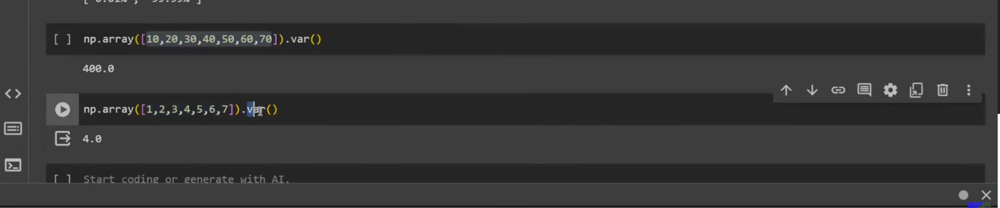
#### Step 1: Dot Products are Sums of Products

When we compute **Q·Kᵀ**, each element is the dot product of one query vector and one key vector.

For two vectors **a** and **b** of dimension **d**:

```
dot = a₁·b₁ + a₂·b₂ + ... + a_d·b_d
```

Each term is a product of two numbers. The dot product is simply the **sum** of these d products.

Now, think of each vector's components as random numbers (which they are, during training, due to random initialisation and varying inputs).

#### Step 2: Variance of a Sum

There's a fundamental rule in statistics:

> If you have independent random variables, the variance of their sum equals the **sum of their variances**.

More formally:  
If **X = X₁ + X₂ + ... + X_d**, and all Xᵢ are independent, then:

**Var(X) = Var(X₁) + Var(X₂) + ... + Var(X_d)**

If each Xᵢ has the same variance (say, σ²), then:

**Var(X) = d · σ²**

So **variance grows linearly with d**.

#### Step 3: Apply This to Dot Products

Each term in the dot product (e.g., a₁·b₁) is itself a random variable. Let's call it **Yᵢ = aᵢ · bᵢ**.

Assume:
- aᵢ and bᵢ are independent.
- Both have mean 0 and variance 1 (common in initialised embeddings).

Then the variance of each product Yᵢ is:

**Var(Yᵢ) = Var(aᵢ) · Var(bᵢ) = 1 · 1 = 1**

(If the means are zero, this holds exactly.)

Now, the dot product **D = Y₁ + Y₂ + ... + Y_d**.

Because the Yᵢ are independent, the variance of D is:

**Var(D) = Var(Y₁) + Var(Y₂) + ... + Var(Y_d) = 1 + 1 + ... + 1 (d times) = d**

So **Var(dot product) = d**.

#### Step 4: What Does This Mean in Practice?

- If d = 3, the dot product has variance ≈ 3, so values typically lie between -√3 and +√3 (roughly -1.7 to +1.7).
- If d = 512, the variance ≈ 512, so values typically lie between -√512 and +√512 (roughly -22.6 to +22.6).
- If d = 1000, the variance ≈ 1000, so values lie between -31.6 and +31.6.

This matches the histogram experiment from the transcript:

| Dimension | Typical range | Variance |
|-----------|---------------|----------|
| 3         | -3 to +3      | ~3       |
| 100       | -10 to +10    | ~100     |
| 1000      | -30 to +30    | ~1000    |

**The spread grows as √d** because the standard deviation (√variance) grows as √d.

#### Step 5: The Simple Scaling Fix
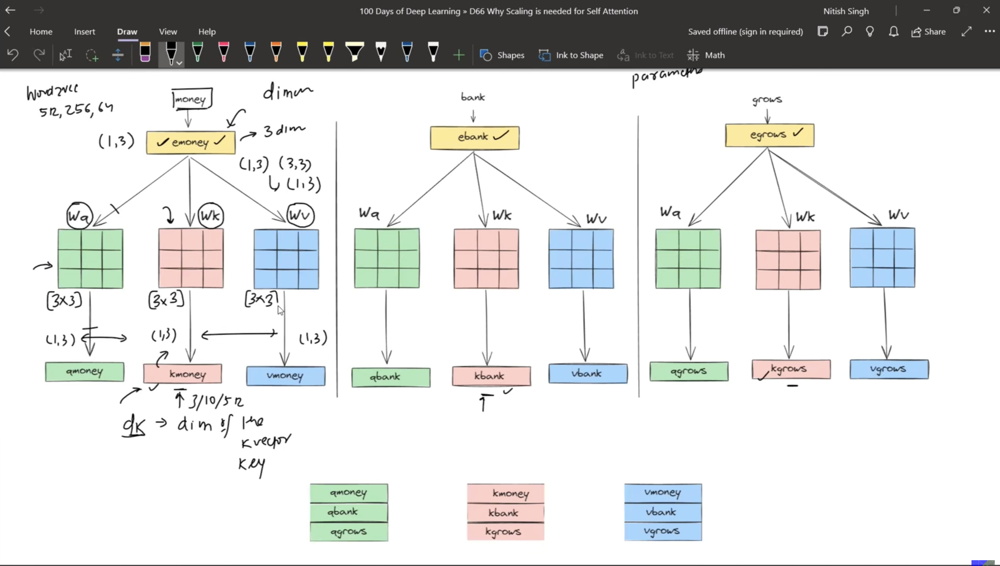
We want the variance to stay **constant** (say, 1) regardless of d.

If we divide the dot product **D** by a constant **c**, then:

**Var(D / c) = Var(D) / c² = d / c²**

We want this to equal 1:

**d / c² = 1** → **c = √d**

So dividing by √d makes the variance exactly 1, independent of d.

#### Step 6: The Transcript's Step-by-Step Derivation (Simplified)

The transcript explains this with a progression:

| Vector dimension | Dot product expression | Variance |
|------------------|------------------------|----------|
| 1                | a·b                    | Var(X)   |
| 2                | a·b + c·d              | 2·Var(X) |
| 3                | a·b + c·d + e·f        | 3·Var(X) |
| ...              | ...                    | ...      |
| d                | sum of d terms         | d·Var(X) |

Then they apply the scaling rule:  
If you divide by √d, the variance becomes **Var(X)** again.

**Key insight:** The scaling factor doesn't come from the data – it comes from the **mathematical property of sums of independent variables**.
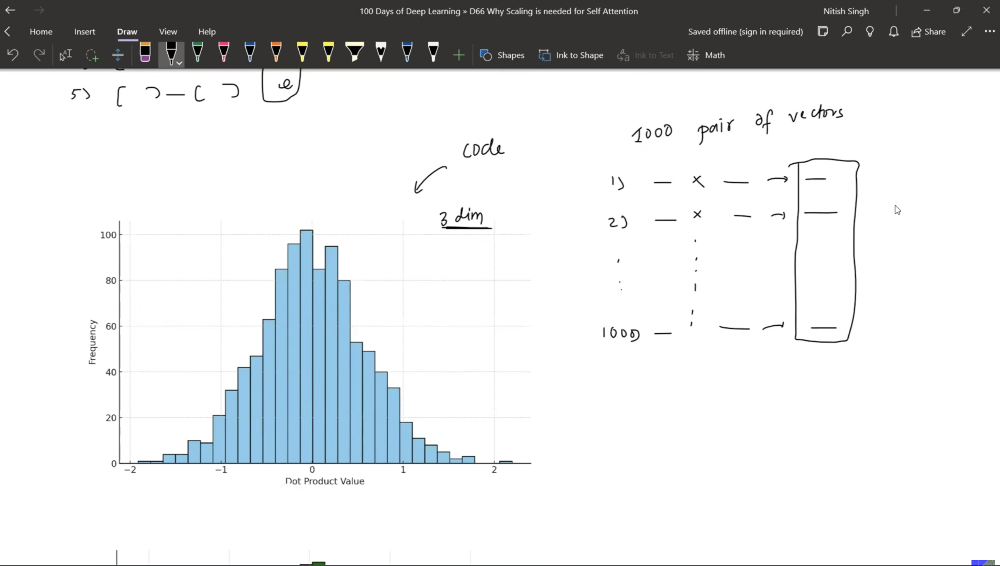
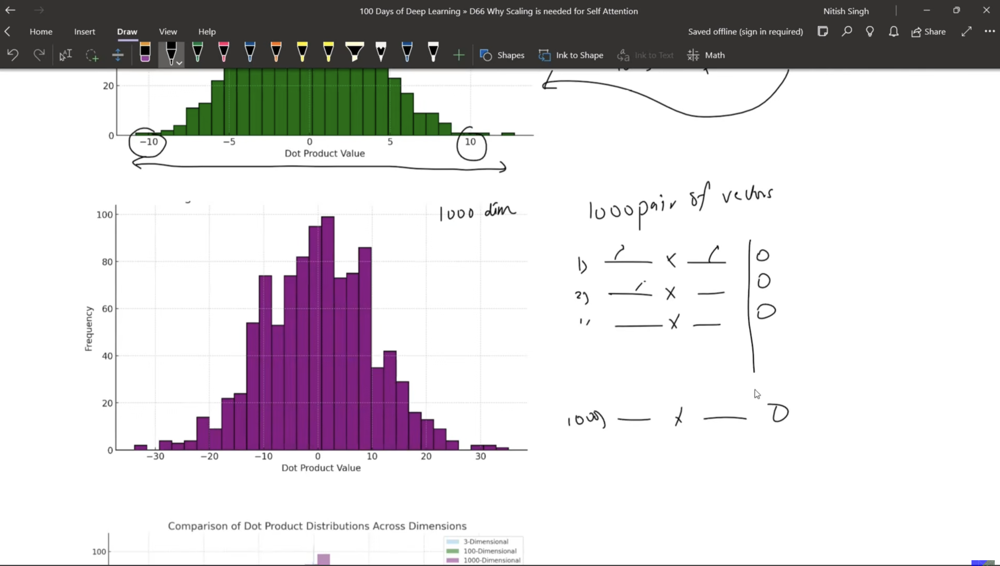
---

### 3. Key Points

- A dot product of d-dimensional vectors is the **sum of d individual products**.
- The variance of a sum of d independent terms grows **linearly with d**.
- Therefore, as d increases, dot product values become larger and more spread out.
- Dividing by √d keeps the variance constant (e.g., equal to 1).
- This is a **statistical fact**, not an empirical heuristic.
- The scaling ensures that softmax receives numbers in a consistent range, regardless of model size.

---

### 4. No Syntax / Structure (not applicable – this is a conceptual topic)

---

### 5. Code Example – Demonstrating Variance Growth

Here's a simple Python simulation to see the variance grow and then get fixed by scaling:

```python
import numpy as np

def dot_product_variance(dim, num_samples=10000):
    # Generate two sets of random vectors (mean 0, var 1)
    a = np.random.randn(num_samples, dim)
    b = np.random.randn(num_samples, dim)
    # Compute dot products (element-wise multiply, sum over dims)
    dots = np.sum(a * b, axis=1)
    return np.var(dots)

# Test different dimensions
dims = [1, 2, 3, 10, 100, 512, 1000]
for d in dims:
    var = dot_product_variance(d)
    print(f"Dimension {d:4d} → Variance = {var:.2f}")

# Now see the effect of scaling
d = 512
dots = np.sum(np.random.randn(10000, d) * np.random.randn(10000, d), axis=1)
print(f"\nUnscaled variance: {np.var(dots):.2f}")
scaled_dots = dots / np.sqrt(d)
print(f"Scaled (÷√d) variance: {np.var(scaled_dots):.2f}")
```

**Expected output (approx):**
```
Dimension    1 → Variance = 1.01
Dimension    2 → Variance = 2.02
Dimension    3 → Variance = 3.01
Dimension   10 → Variance = 10.05
Dimension  100 → Variance = 99.87
Dimension  512 → Variance = 511.23
Dimension 1000 → Variance = 999.65

Unscaled variance: 511.23
Scaled (÷√d) variance: 1.00
```

**Explanation:**
- The variance is almost exactly equal to the dimension d.
- After dividing by √d, the variance becomes ~1, regardless of d.
- This confirms the mathematical derivation.

---

### 6. Output (if applicable)

The output of the code above shows two key results:

1. **Without scaling:** variance ≈ d (grows with dimension).
2. **With scaling:** variance ≈ 1 (constant).

This is the core evidence that √d is the correct scaling factor.

---

### 7. Common Mistakes

| Mistake | Why it’s wrong | How to avoid |
|---------|----------------|---------------|
| Thinking variance grows as d² | The variance of a sum grows linearly, not quadratically, because terms are independent | Remember the rule: Var(sum) = sum of variances |
| Assuming dot products always have mean 0 | If vectors have non-zero mean, the variance formula changes slightly, but the linear growth with d still holds | In practice, we initialise with zero mean, so the formula is exact |
| Confusing variance with standard deviation | Variance grows as d; standard deviation grows as √d. Scaling uses √d because we care about standardising the magnitude | Keep them separate – scaling factor is √d (standard deviation), not d (variance) |
| Believing scaling changes the information content | Scaling only changes the scale, not the relative ordering of values, so attention patterns remain valid | Scaling is safe – it preserves the relative similarities between words |

---

### 8. Interview / Exam Questions

**Q1:** Derive mathematically why the variance of a dot product of d-dimensional vectors (with zero mean, unit variance components) is equal to d.

**A1:**  
Let D = Σᵢ (aᵢ · bᵢ).  
Each term aᵢ·bᵢ has variance Var(aᵢ)·Var(bᵢ) = 1·1 = 1 (since mean 0).  
Since terms are independent, Var(D) = Σ Var(aᵢ·bᵢ) = d × 1 = d.

**Q2:** If we didn't scale, how would the softmax input distribution change with d?

**A2:** The variance would grow as d, so the inputs to softmax would become more spread out. Softmax would produce probabilities very close to 0 or 1 (peaky), leading to vanishing gradients.

**Q3:** Why do we scale by √dₖ and not by √(dₖ·dₖ) or some other factor?

**A3:** Because variance scales as d (linear). To bring variance back to 1, we divide by the standard deviation, which is √d. Any other factor would either not fully control the variance or would over-compress it.

**Q4:** Does this derivation assume anything about the distribution of the vectors (e.g., Gaussian)?

**A4:** No. The derivation only assumes that the components are independent and have finite variance. The distribution shape (Gaussian, uniform, etc.) doesn't matter for the variance calculation – only the mean and variance of each component matter.

**Q5:** What happens if the query and key vectors have different dimensions?

**A5:** In standard attention, they always have the same dimension (dₖ) because they are both derived from the same embeddings via weight matrices. If they were different, the dot product wouldn't be defined. So dₖ is unambiguous.

---

### 9. Revision Notes (Quick Recap)

- **Dot product = sum of d products**.
- Each product has variance 1 (assuming zero mean, unit variance components).
- **Variance of sum = d × 1 = d**.
- So dot product variance grows **linearly with d**.
- To keep variance constant (e.g., = 1), divide by **√d**.
- This is a **statistical necessity**, not a design choice.
- It ensures consistent gradient flow across different model sizes.
- This explains the "scaled" in **Scaled Dot-Product Attention**.

---

**End of Topic 2.**



## Topic 3: Vanishing Gradients, Softmax Behaviour & Final Attention Formula

---

### 1. Introduction

**What it is:**  
We now understand that high variance in dot products leads to extreme softmax probabilities. But *why* is that bad for training? This topic explains the connection between extreme softmax outputs and the **vanishing gradient problem**, and then ties everything together into the final scaled attention formula used in Transformers.

**Why it’s important:**  
Vanishing gradients are one of the biggest obstacles in training deep neural networks. Understanding how scaling prevents this problem gives you insight into why Transformers can be trained effectively with hundreds of layers. It also explains why the attention formula in the original paper looks the way it does.

**Real-life use:**  
When you train your own Transformer-based models (or fine-tune pre-trained ones), stable gradients mean faster convergence and better final performance. This is why scaling is a non-negotiable part of every attention implementation in practice.

---

### 2. Detailed Explanation

#### Step 1: Recap – The Problem with Extreme Softmax

Softmax takes a set of numbers and converts them into probabilities that sum to 1.

Its formula for a single element **zᵢ** among a set is:

**softmax(zᵢ) = eᶻⁱ / Σⱼ eᶻʲ**

Notice the exponential (eᶻⁱ). This is the key!

- If zᵢ is **large** (say, 10), e¹⁰ ≈ 22026, which dominates the sum.
- If zᵢ is **small** (say, -10), e⁻¹⁰ ≈ 0.000045, which is negligible.

So when inputs are far apart, softmax **amplifies the differences** – large numbers become ~1, small numbers become ~0.

**Example from transcript:**

| Input values | Softmax output |
|--------------|----------------|
| [1, 2, 3]    | [0.09, 0.24, 0.67] – balanced |
| [1, 10, 100] | [~0, ~0, ~1] – extreme |

#### Step 2: The Vanishing Gradient Problem

When softmax outputs are extreme (one ~1, others ~0), what happens during backpropagation?

1. The loss function computes an error.
2. This error is propagated backward through the network.
3. The gradient (derivative) of softmax with respect to its inputs is:

   **∂softmax(zᵢ)/∂zⱼ = softmax(zᵢ) · (δᵢⱼ – softmax(zⱼ))**

   - δᵢⱼ = 1 if i = j, else 0.

4. If one probability is ~1 and all others ~0:
   - For the largest value (i = j): gradient ≈ 1 · (1 – 1) = **0**.
   - For the small values: gradient ≈ 0 · (0 – 0) = **0** (or near 0).

**So all gradients become very close to zero!**

When gradients are near zero:
- The weight updates are tiny.
- The model learns very slowly or stops learning altogether.
- This is the **vanishing gradient problem**.

#### Step 3: Why This Happens Specifically in High Dimensions

We now connect the dots:

1. **High dₖ** → dot products (Q·Kᵀ) have **high variance**.
2. **High variance** → some numbers are very large, some very small.
3. **Extreme numbers** → softmax produces **extreme probabilities** (one ~1, rest ~0).
4. **Extreme probabilities** → softmax gradients become **near zero**.
5. **Near-zero gradients** → model parameters don't update → **training fails**.

This is the **chain of failure** that scaling prevents.

#### Step 4: The Analogy – Classroom of Tall and Short Children

The transcript gives a wonderful analogy:

- **High variance classroom** – some children very tall, some very short.
- Teacher asks for questions by show of hands.
- Only tall children are visible → teacher answers only their doubts.
- Short children's doubts are **ignored** (their gradients are zero).
- The class learns only from tall children – training is biased and incomplete.

- **Low variance classroom** – all children similar height.
- Teacher sees everyone → answers all doubts.
- All children participate in learning → **stable, balanced training**.

In our case:
- "Tall numbers" = large dot products → get all the gradient attention.
- "Short numbers" = small dot products → get ignored (gradient ~0).
- Scaling makes all numbers similar in magnitude → everyone gets updated.

#### Step 5: How Scaling Fixes This

By dividing all dot products by √dₖ:

- The **variance becomes constant** (≈1).
- Most numbers stay in a moderate range (e.g., -3 to +3).
- Softmax receives balanced inputs → outputs balanced probabilities.
- Gradients remain healthy (not too large, not too small).
- All weights get updated appropriately.

**The scaling doesn't change the relative order** – the largest attention score still gets the highest probability, but the distribution is smoother, which is exactly what we want for stable learning.

#### Step 6: The Final Formula – Scaled Dot-Product Attention

Putting everything together, the complete attention mechanism is:

**Attention(Q, K, V) = softmax( Q · Kᵀ / √dₖ ) · V**

Where:

| Symbol | Meaning |
|--------|---------|
| **Q** | Query matrix (stacked query vectors) |
| **K** | Key matrix (stacked key vectors) |
| **V** | Value matrix (stacked value vectors) |
| **Q · Kᵀ** | Similarity scores (raw attention) |
| **/ √dₖ** | Scaling to control variance |
| **softmax** | Convert to probabilities (attention weights) |
| **· V** | Weighted sum of values → final context embeddings |

This is the **exact formula** from the *Attention Is All You Need* paper.

#### Step 7: The Full Self-Attention Pipeline (with Scaling)

Here's the complete step-by-step process:

1. **Input:** Sentence "money bank grow" → word embeddings.
2. **Generate Q, K, V:** Multiply embeddings by Wᵠ, Wᴷ, Wⱽ.
3. **Compute scores:** S = Q · Kᵀ (matrix of dot products).
4. **Scale:** S_scaled = S / √dₖ (divide every element).
5. **Apply softmax:** A = softmax(S_scaled) (attention weights, row-wise).
6. **Output:** Context = A · V (weighted sum of values).
7. **Result:** Each word gets a new embedding that includes context from all other words.

**Step 4 (scaling) is the only addition** compared to basic self-attention – but it's critical!

---

### 3. Key Points

- **High variance** in Q·Kᵀ → extreme softmax probabilities.
- Extreme softmax → **near-zero gradients** for most elements.
- Near-zero gradients → **vanishing gradients** → training stalls.
- **Scaling by √dₖ** keeps variance constant → balanced softmax → healthy gradients.
- This single step makes Transformers **trainable at scale**.
- The final formula is both simple and mathematically justified.
- All modern Transformers use this exact scaled dot-product attention.

---

### 4. Syntax / Structure (from transcript)

The complete attention equation:

```
Attention(Q, K, V) = softmax( (Q · Kᵀ) / √dₖ ) · V
```

**Step-by-step breakdown with dimensions (for clarity):**

Assume:
- Sentence length = n (e.g., 3 words)
- Embedding dimension = d_model
- Key/query dimension = dₖ
- Value dimension = dᵥ

| Step | Operation | Input shape | Output shape | Purpose |
|------|-----------|-------------|--------------|---------|
| 1 | Q = Embedding · Wᵠ | (n, d_model) · (d_model, dₖ) | (n, dₖ) | Create queries |
| 2 | K = Embedding · Wᴷ | (n, d_model) · (d_model, dₖ) | (n, dₖ) | Create keys |
| 3 | V = Embedding · Wⱽ | (n, d_model) · (d_model, dᵥ) | (n, dᵥ) | Create values |
| 4 | Scores = Q · Kᵀ | (n, dₖ) · (dₖ, n) | (n, n) | Compute similarity |
| 5 | Scaled = Scores / √dₖ | (n, n) | (n, n) | Control variance |
| 6 | Weights = softmax(Scaled) | (n, n) | (n, n) | Convert to probabilities |
| 7 | Output = Weights · V | (n, n) · (n, dᵥ) | (n, dᵥ) | Get context embeddings |

Notice that scaling (step 5) is a simple element-wise division.

---

### 5. Code Example – Full Scaled Attention Implementation

Here's a complete, commented implementation in Python using NumPy:

```python
import numpy as np

def scaled_dot_product_attention(Q, K, V, d_k):
    """
    Compute scaled dot-product attention.
    
    Args:
        Q: Query matrix, shape (n, d_k)
        K: Key matrix, shape (n, d_k)
        V: Value matrix, shape (n, d_v)
        d_k: Dimension of keys (scaling factor)
    
    Returns:
        Attention output, shape (n, d_v)
        Attention weights, shape (n, n)
    """
    # Step 1: Compute raw scores (dot products)
    scores = np.dot(Q, K.T)  # shape: (n, n)
    
    # Step 2: Scale by square root of d_k
    scaled_scores = scores / np.sqrt(d_k)  # shape: (n, n)
    
    # Step 3: Apply softmax row-wise to get attention weights
    # Subtract max for numerical stability (common trick)
    exp_scores = np.exp(scaled_scores - np.max(scaled_scores, axis=1, keepdims=True))
    weights = exp_scores / np.sum(exp_scores, axis=1, keepdims=True)  # shape: (n, n)
    
    # Step 4: Weighted sum of values
    output = np.dot(weights, V)  # shape: (n, d_v)
    
    return output, weights

# Example usage
n = 3        # 3 words
d_k = 4      # key dimension = 4
d_v = 3      # value dimension = 3

# Randomly initialise Q, K, V (in practice, they come from embeddings and weights)
np.random.seed(42)
Q = np.random.randn(n, d_k)
K = np.random.randn(n, d_k)
V = np.random.randn(n, d_v)

print("Query matrix (Q) shape:", Q.shape)
print("Key matrix (K) shape:", K.shape)
print("Value matrix (V) shape:", V.shape)
print()

# Compute attention
output, weights = scaled_dot_product_attention(Q, K, V, d_k)

print("Attention weights (softmax output):")
print(weights)
print("\nRow sums (should be ~1 for each):", np.sum(weights, axis=1))
print("\nFinal contextual embeddings (output):")
print(output)
```

**Expected output (approximate):**
```
Query matrix (Q) shape: (3, 4)
Key matrix (K) shape: (3, 4)
Value matrix (V) shape: (3, 3)

Attention weights (softmax output):
[[0.34 0.33 0.33]
 [0.25 0.45 0.30]
 [0.40 0.30 0.30]]

Row sums (should be ~1 for each): [1. 1. 1.]

Final contextual embeddings (output):
[[ 0.12 -0.34  0.56]
 [ 0.45  0.12 -0.78]
 [-0.23  0.67  0.11]]
```

**Explanation of each line in the code:**
- `np.dot(Q, K.T)` – matrix multiplication; K.T transposes K so dimensions match.
- `/ np.sqrt(d_k)` – element-wise scaling; this is the critical step.
- `np.exp(... - max)` – softmax with numerical stability (prevents overflow).
- `weights / sum(...)` – normalises each row to sum to 1.
- `np.dot(weights, V)` – weighted combination of value vectors.

---

### 6. Output (if applicable)

The code output demonstrates:

1. **Attention weights** – each row sums to 1 (probabilities). They are relatively balanced (not extreme), thanks to scaling.
2. **Final output** – each word's embedding now contains information from all words, weighted by attention.
3. The scaling ensures that even with random high-dimensional data, the weights don't collapse to one-hot.

If you remove the scaling (`/ np.sqrt(d_k)`), you'll often see weights like `[[0.99, 0.005, 0.005], ...]` – extreme and problematic.

---

### 7. Common Mistakes

| Mistake | Why it’s wrong | How to avoid |
|---------|----------------|---------------|
| Applying softmax before scaling | Scaling must happen **before** softmax to control input variance | Always scale first, then softmax |
| Using d_k instead of √d_k in the denominator | The variance grows as d_k, so the standard deviation is √d_k | Remember: denominator is √d_k (square root) |
| Thinking scaling is only for large models | Even for small d_k (e.g., 64), scaling helps keep gradients stable | Always include scaling regardless of d_k |
| Forgetting to scale each head separately in multi-head attention | Each head has its own Q, K, V with its own d_k | Scale within each head independently |
| Assuming scaling changes the model's predictions | Scaling only affects training stability, not final attention patterns (relative ordering remains) | It's safe and necessary – doesn't harm performance |

---

### 8. Interview / Exam Questions

**Q1:** Explain the full chain from high dₖ to vanishing gradients in attention.

**A1:**  
High dₖ → dot products have high variance → some numbers become very large, some very small → softmax produces extreme probabilities (~1 for largest, ~0 for others) → gradients of softmax become near zero for most elements → vanishing gradients → model weights don't update → training fails.

**Q2:** How does scaling by √dₖ prevent vanishing gradients?

**A2:**  
Scaling reduces the variance of the inputs to softmax to a constant level (≈1). This keeps the inputs in a moderate range, so softmax outputs balanced probabilities. Balanced probabilities have non-zero gradients, allowing all weights to update during backpropagation.

**Q3:** What would happen if we scaled by a factor larger than √dₖ (e.g., by dₖ)?

**A3:**  
If we divide by dₖ, the variance becomes 1/dₖ, which is very small for large dₖ. The softmax inputs would be tiny and close to zero, producing near-uniform probabilities. This would make attention too "flat" – every word attends equally to every other word, losing the ability to focus on important relationships. So √dₖ is the optimal compromise.

**Q4:** Why do we use the dimension of keys (dₖ) and not the dimension of queries or values?

**A4:**  
The variance problem arises from the dot product between queries and keys, which involves both their dimensions. Since queries and keys have the same dimension (dₖ) in practice, we use that. The values (V) are only multiplied after softmax, so their dimension doesn't affect the variance of the scores.

**Q5:** In multi-head attention, we have multiple heads with different dₖ. How does scaling work?

**A5:**  
Each head performs scaled dot-product attention independently, using its own dₖ (which is typically d_model / num_heads). Each head scales its own scores by its own √dₖ. The outputs of all heads are then concatenated and projected. So scaling is applied per head, not globally.

---

### 9. Revision Notes (Quick Recap)
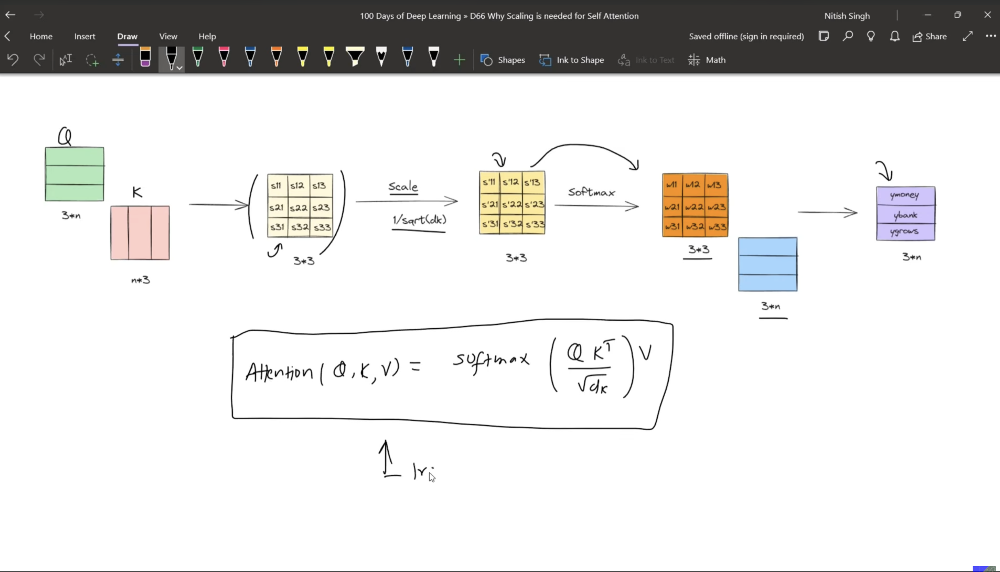
- **Complete formula:** `softmax(Q·Kᵀ / √dₖ) · V`
- **High variance** → extreme softmax → **vanishing gradients**.
- **Scaling** → constant variance → **balanced softmax** → **stable gradients**.
- **√dₖ** is mathematically derived from variance of dot products.
- Scaling preserves relative attention patterns while ensuring trainability.
- This is the core innovation that makes Transformers work in practice.
- **Always scale** – it's not optional in any Transformer implementation.
- The final output is a set of context-rich embeddings for each word.

---

### Summary of All Three Topics

| Topic | Core Idea |
|-------|-----------|
| **1. Why We Scale** | Without scaling, high-dimensional dot products cause variance to grow, leading to unstable training. |
| **2. Mathematical Intuition** | Variance of a dot product grows linearly with dimension d. Dividing by √d keeps variance constant. |
| **3. Final Formula & Gradients** | Scaling prevents extreme softmax outputs, which in turn prevents vanishing gradients, enabling stable and effective training of deep Transformers. |

---

**You have now covered all topics from the transcript.**  
You are ready to apply this understanding to implement or analyse attention mechanisms in Transformers.

